#### Importing important libraries

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
data = pd.read_csv(r"C:\Users\ABC\Desktop\data science project\data oil prices.csv")

In [3]:
data.head()

,Date,"Cushing, OK WTI Spot Price FOB (Dollars per Barrel)",Europe Brent Spot Price FOB (Dollars per Barrel),Unnamed: 3
0,"Jan 02, 1986",25.56,NaN,NaN
1,"Jan 03, 1986",26.00,NaN,NaN
2,"Jan 06, 1986",26.53,NaN,NaN
3,"Jan 07, 1986",25.85,NaN,NaN
4,"Jan 08, 1986",25.87,NaN,NaN


### EDA

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9585 entries, 0 to 9584
Data columns (total 4 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Date                                                 9584 non-null   object 
 1   Cushing, OK WTI Spot Price FOB (Dollars per Barrel)  9434 non-null   float64
 2   Europe Brent Spot Price FOB (Dollars per Barrel)     9151 non-null   float64
 3   Unnamed: 3                                           0 non-null      float64
dtypes: float64(3), object(1)
memory usage: 299.7+ KB


In [5]:
data.describe()

,"Cushing, OK WTI Spot Price FOB (Dollars per Barrel)",Europe Brent Spot Price FOB (Dollars per Barrel),Unnamed: 3
count,9434.000000,9151.000000,0.0
mean,46.379674,48.919745,NaN
std,29.593001,32.859279,NaN
min,-36.980000,9.100000,NaN
25%,20.040000,19.135000,NaN
50%,36.875000,40.370000,NaN
75%,68.447500,71.475000,NaN
max,145.310000,143.950000,NaN


In [6]:
# here we need only date and price of the crude oil on that perticular date 
data = data.iloc[:,[0,1]]
data

,Date,"Cushing, OK WTI Spot Price FOB (Dollars per Barrel)"
0,"Jan 02, 1986",25.56
1,"Jan 03, 1986",26.00
2,"Jan 06, 1986",26.53
3,"Jan 07, 1986",25.85
4,"Jan 08, 1986",25.87
...,...,...
9580,"Jun 07, 2023",72.52
9581,"Jun 08, 2023",71.28
9582,"Jun 09, 2023",70.16
9583,"Jun 12, 2023",67.08


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9585 entries, 0 to 9584
Data columns (total 2 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Date                                                 9584 non-null   object 
 1   Cushing, OK WTI Spot Price FOB (Dollars per Barrel)  9434 non-null   float64
dtypes: float64(1), object(1)
memory usage: 149.9+ KB


we have dataset consists of 9585 days from 1986 to 2023  with the crude oil price on that day.There are 2 variables date and price. There are some missing values

In [8]:
#renaiming the column name 
data.columns = ['DATE', 'PRICE']
data.head()

,DATE,PRICE
0,"Jan 02, 1986",25.56
1,"Jan 03, 1986",26.00
2,"Jan 06, 1986",26.53
3,"Jan 07, 1986",25.85
4,"Jan 08, 1986",25.87


In [9]:
# Select duplicate rows of all columns
df = data[data.duplicated()]
print(df)

Empty DataFrame
Columns: [DATE, PRICE]
Index: []


### there are lot of nan values in the data set we have to treat them or drop them.

In [10]:
# checking for nan values
data.isna().sum()

DATE       1
PRICE    151
dtype: int64

In [11]:
#last row is having nan value in both the column ,lets drop it 
data=data.drop(data.index[[9584]],axis=0)
data.tail()

,DATE,PRICE
9579,"Jun 06, 2023",71.71
9580,"Jun 07, 2023",72.52
9581,"Jun 08, 2023",71.28
9582,"Jun 09, 2023",70.16
9583,"Jun 12, 2023",67.08


In [12]:
data.isna().sum()

DATE       0
PRICE    150
dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PRICE'>

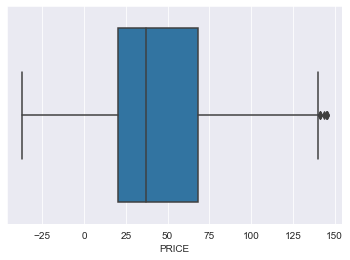

In [13]:
sns.boxplot(data.PRICE)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PRICE', ylabel='Density'>

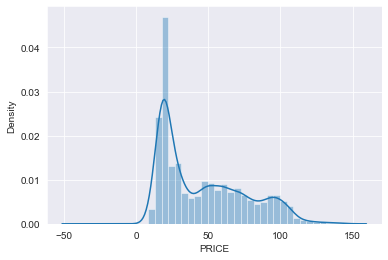

In [14]:
sns.distplot(data['PRICE'])

#### from above boxplot and distributiopn plot we can say that price distribution is rightly skewed so we use median , as the median is less sensitive to outliers than the mean.

In [15]:
data=data.fillna(data.median())
data.head()

C:\Users\ABC\AppData\Local\Temp\ipykernel_5756\590422319.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data=data.fillna(data.median())


,DATE,PRICE
0,"Jan 02, 1986",25.56
1,"Jan 03, 1986",26.00
2,"Jan 06, 1986",26.53
3,"Jan 07, 1986",25.85
4,"Jan 08, 1986",25.87


In [16]:
data.isna().sum()

DATE     0
PRICE    0
dtype: int64

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9584 entries, 0 to 9583
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DATE    9584 non-null   object 
 1   PRICE   9584 non-null   float64
dtypes: float64(1), object(1)
memory usage: 149.9+ KB


### converting date format

In [18]:
data['DATE']=pd.to_datetime(data['DATE'], infer_datetime_format=True)
DATA=data.set_index(['DATE'])
DATA.head()

,PRICE
DATE,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


Text(0, 0.5, 'PRICE')

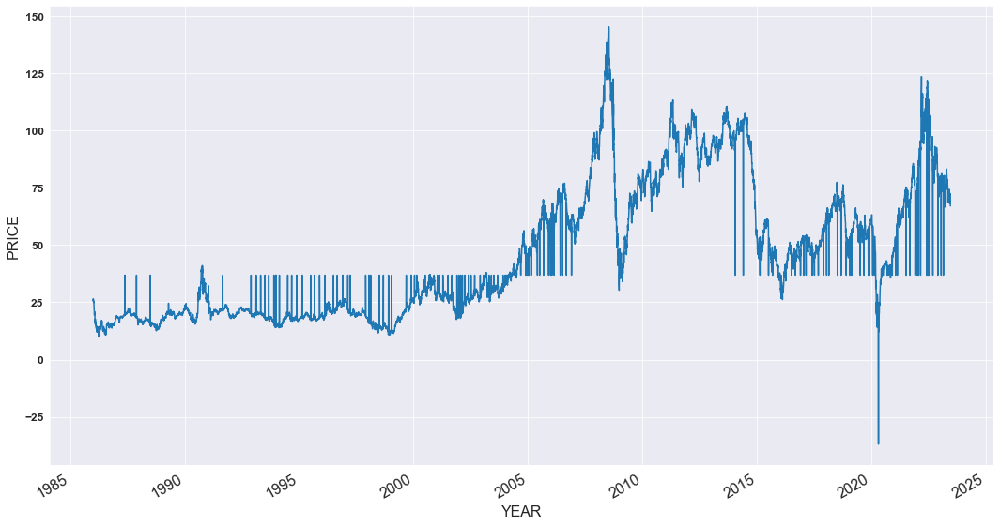

In [19]:
# visualizing the data
DATA.PRICE.plot(figsize=(18,10));
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=16)
plt.xlabel('YEAR',fontsize=16)
plt.ylabel('PRICE',fontsize=16)

In [20]:
DATA[DATA['PRICE']<0]

,PRICE
DATE,
2020-04-20,-36.98


### From above we can see that there is a one negative price =-36.98 on date 20-4-2020 nd it is true by comparing it with original data which is from investing.com

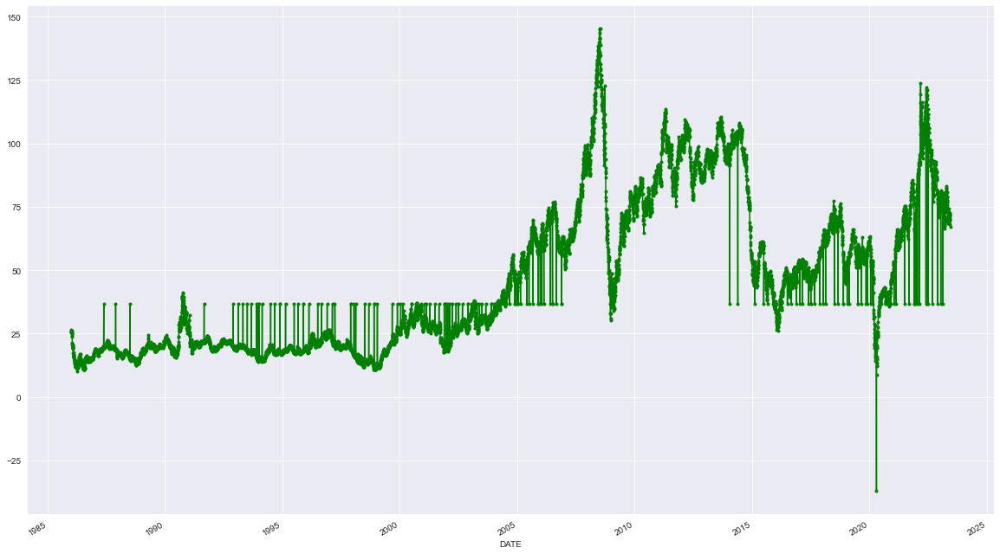

In [21]:
DATA['PRICE'].plot(figsize=(20,12),color='green',marker='.')
plt.show()

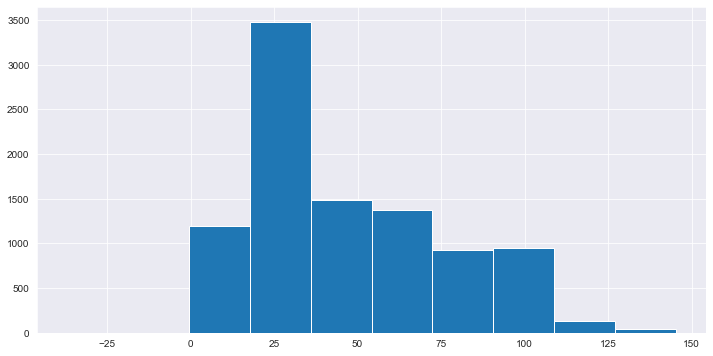

In [22]:
# histogram
DATA['PRICE'].hist(figsize=(12,6))
plt.show()

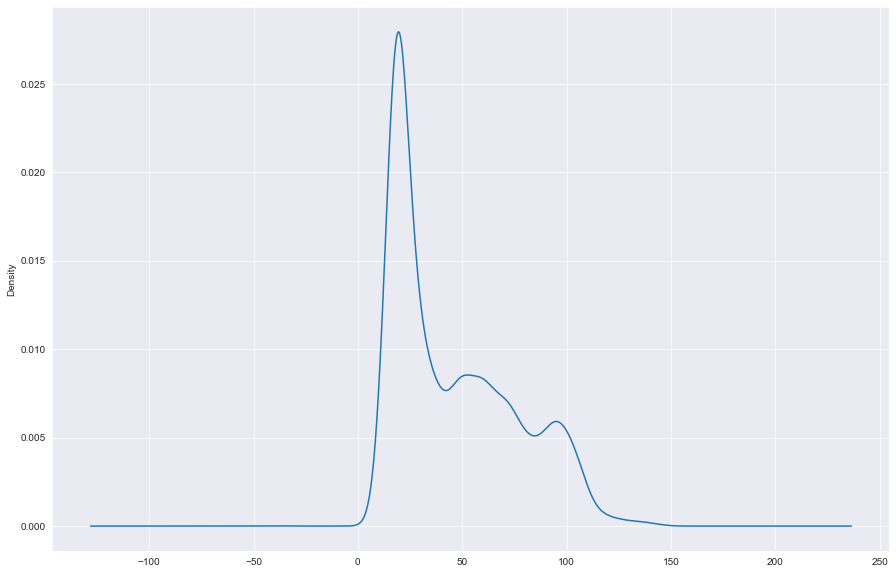

In [23]:
# create a density plot
DATA['PRICE'].plot(kind='kde', figsize=(15,10))
plt.show()

<AxesSubplot:xlabel='PRICE'>

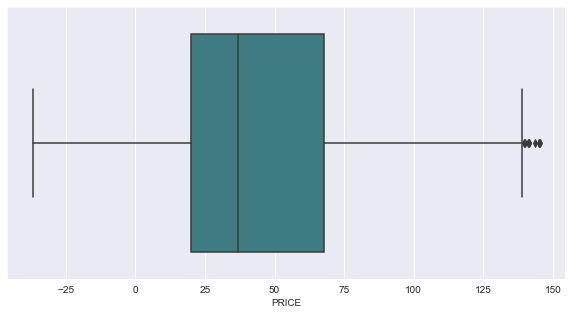

In [24]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x="PRICE",data=DATA,palette='crest')


FROM above histogram , distribution plot, and box plot for the PRICE we can say that- 
* data is rightly skewed and not normaly distributed
* There are some outliars in the dat set in upper quartile that we have to treat or keep as it is 

### Feature Engineering

In [25]:
# adding some important columns month, date, and year
data["month"]= data.DATE.dt.strftime("%b")
data["year"]=data.DATE.dt.strftime("%Y")
data["Date"]=pd.to_datetime(data.DATE,format="%b-%y")
data

,DATE,PRICE,month,year,Date
0,1986-01-02,25.56,Jan,1986,1986-01-02
1,1986-01-03,26.00,Jan,1986,1986-01-03
2,1986-01-06,26.53,Jan,1986,1986-01-06
3,1986-01-07,25.85,Jan,1986,1986-01-07
4,1986-01-08,25.87,Jan,1986,1986-01-08
...,...,...,...,...,...
9579,2023-06-06,71.71,Jun,2023,2023-06-06
9580,2023-06-07,72.52,Jun,2023,2023-06-07
9581,2023-06-08,71.28,Jun,2023,2023-06-08
9582,2023-06-09,70.16,Jun,2023,2023-06-09


## Visualing of price by heatmap

<AxesSubplot:xlabel='month', ylabel='year'>

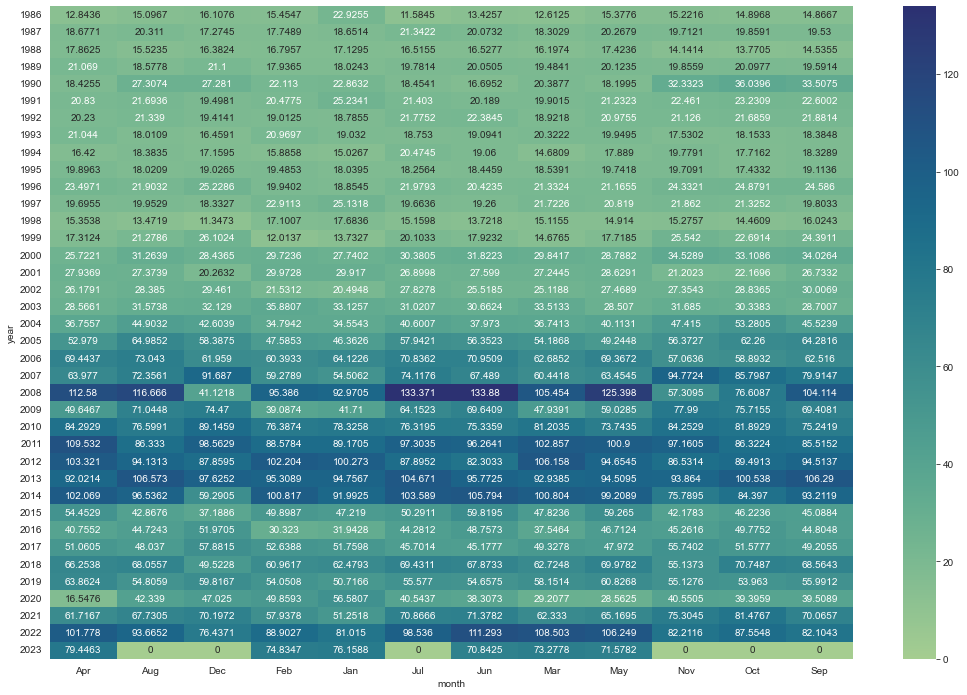

In [26]:
plt.figure(figsize=(18,12))
heatmap_y_month = pd.pivot_table(data=data,values="PRICE",index="year",columns="month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g",cmap='crest')

from above heat map we can say that since 1986 to 2023
* Crude oil price in the us is increasing gradualy.
*  between year 1986 to 1999 avg. price is between 20 to 35 not reach beyond that.
*  From 2000 to 2014 Crudde oil prices are touched  its high upto 133.88 also shown the low upto 41.22 in 2008 crisis and      till 2014 prices settle at 100 dollar 
* And from 2015 prices again fall down and hangs between 80 to 60.
* In 2020 due to PANDEMIC prices fall further till 16 dollar.
* Then from 2021 Prices recovered very well and todays date they are trading at 69 dollar in 2023 

## Boxplot visualisation

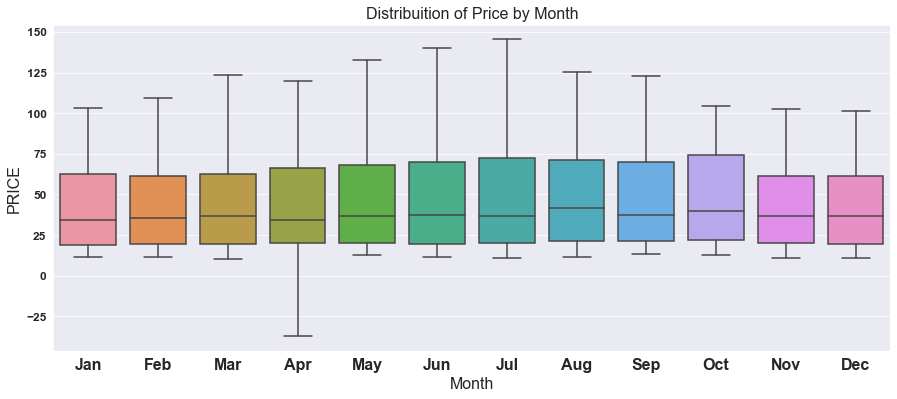

In [27]:
#by month
plt.figure(figsize=(15,6))

sns.boxplot(x="month",y="PRICE",data=data)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=16,fontweight = 'bold')
plt.title('Distribuition of Price by Month',fontsize=16)
plt.xlabel('Month',fontsize=16)
plt.ylabel('PRICE',fontsize=16);

In month july we can say that prices are boom up slightly as compared to the other months 

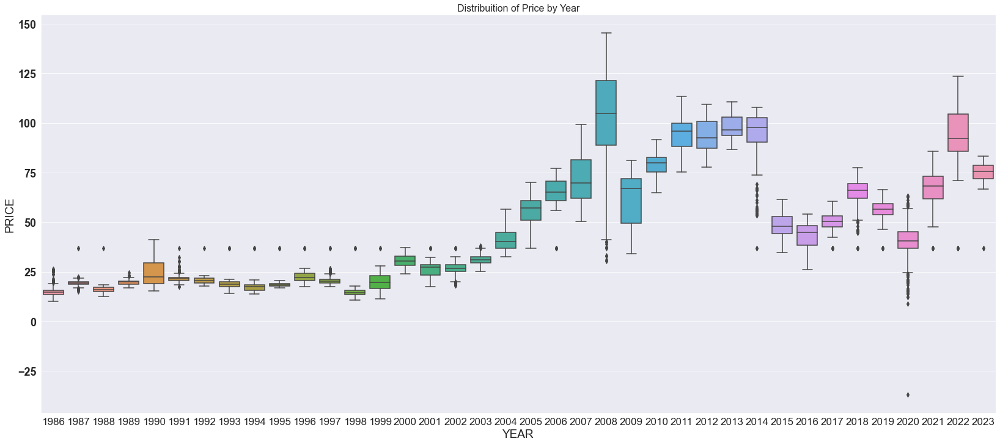

In [28]:
# by Year

plt.figure(figsize=(28,12))
sns.boxplot(x="year",y="PRICE",data=data)
plt.title('Distribuition of Price by Year',fontsize=16)
plt.yticks(fontsize=18,fontweight = 'bold')
plt.xticks(fontsize=17)
plt.xlabel('YEAR',fontsize=19)
plt.ylabel('PRICE',fontsize=19);

We can clearly visualise the 2008 fall from Price 133 to 25 Dollar thats a huge correction of all time on crude oil index.

### Yearly price Analysis

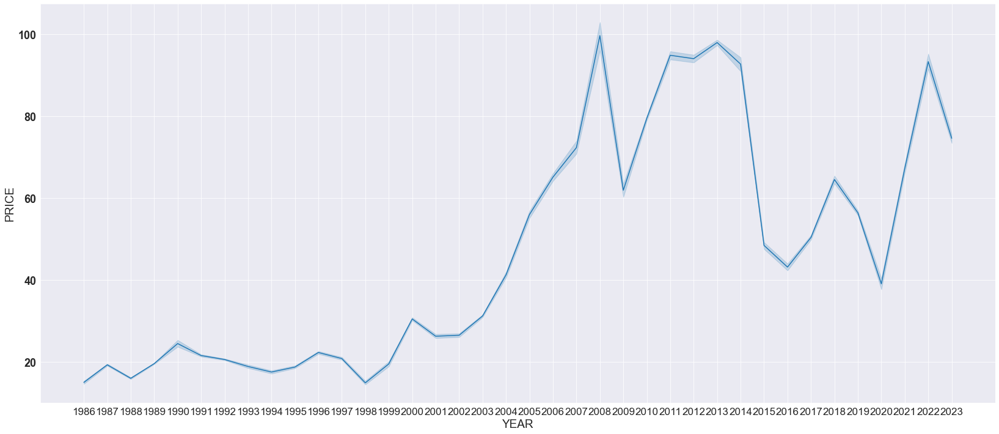

In [29]:
plt.figure(figsize=(28,12))
sns.lineplot(x="year",y="PRICE",data=data);
plt.yticks(fontsize=18,fontweight = 'bold')
plt.xticks(fontsize=17)
plt.xlabel('YEAR',fontsize=19)
plt.ylabel('PRICE',fontsize=19);

Here we can say that by the lineplot, on yearly basis of crude oile price showing smooth movement from past years.

In [30]:
data=data.set_index(['DATE'])
data.head()

,PRICE,month,year,Date
DATE,,,,
1986-01-02,25.56,Jan,1986,1986-01-02
1986-01-03,26.00,Jan,1986,1986-01-03
1986-01-06,26.53,Jan,1986,1986-01-06
1986-01-07,25.85,Jan,1986,1986-01-07
1986-01-08,25.87,Jan,1986,1986-01-08


## lagplot

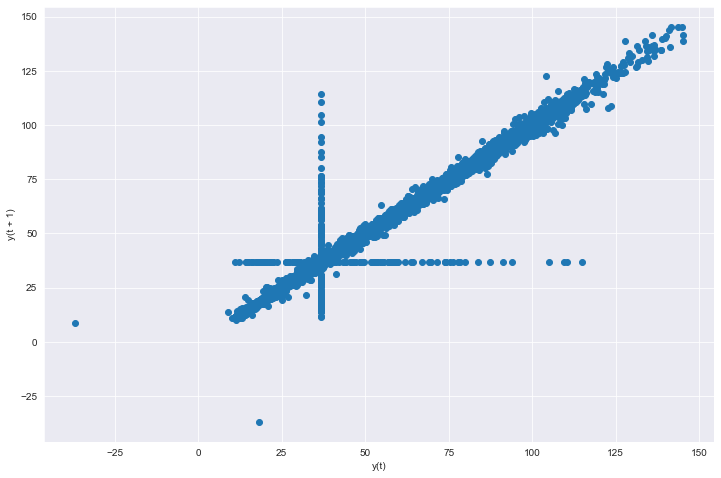

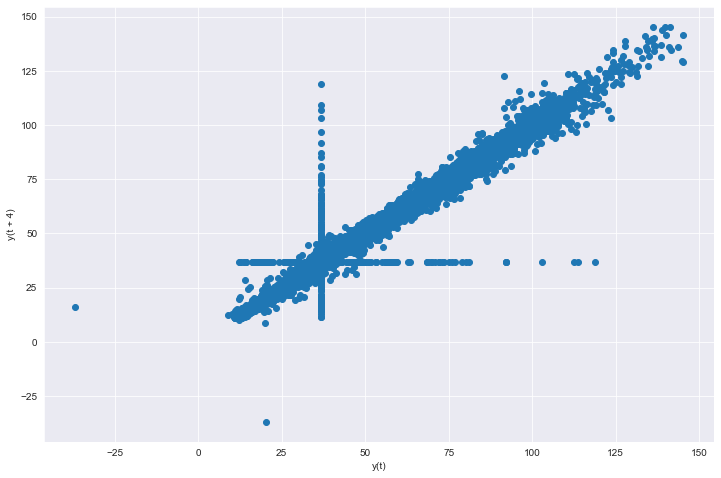

In [31]:
from pandas.plotting import lag_plot
# create a scatter plot
for i in [1, 4]:
    plt.figure(figsize=(12,8))
    lag_plot(data.PRICE, lag=i)
    plt.show()

## MOVING AVERAGE

#### 12 day moving average

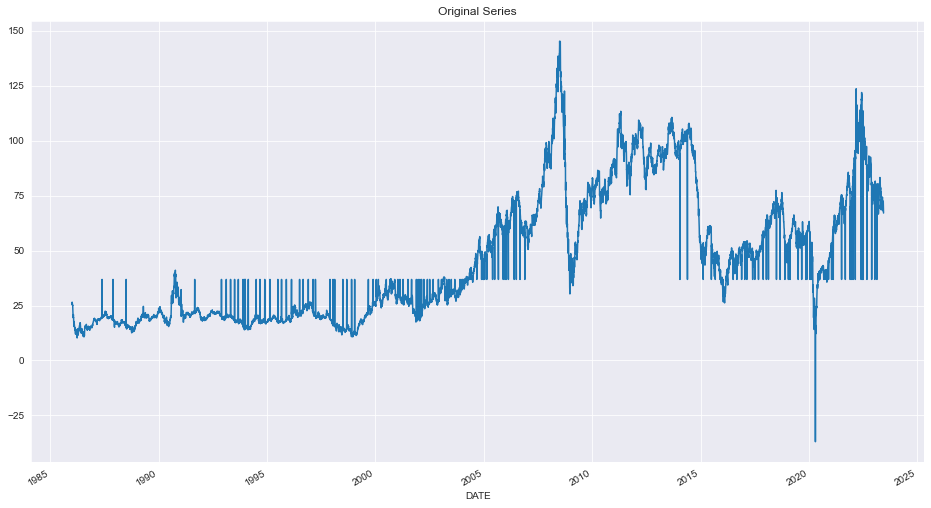

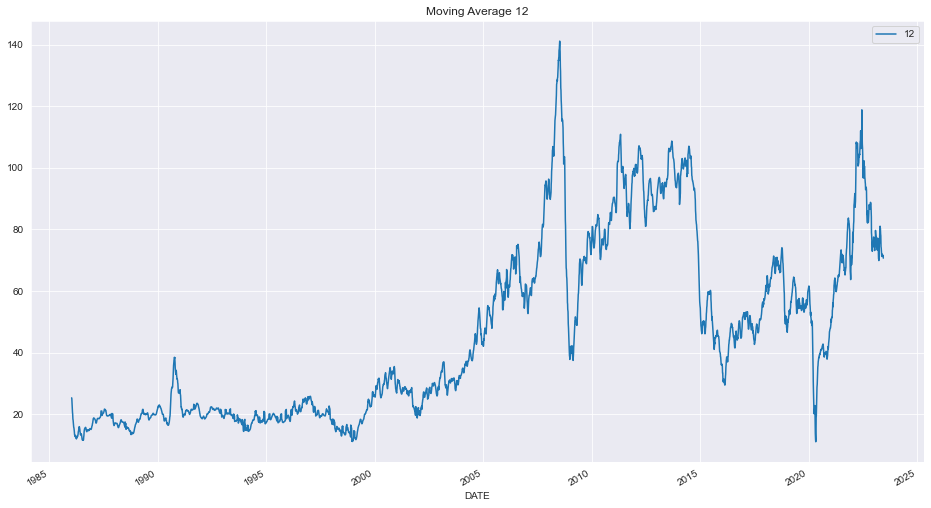

In [32]:
plt.figure(figsize=(16,9))
data.PRICE.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(16,9))
data['PRICE'].rolling(12).mean().plot(label=str(12))
plt.title("Moving Average "+str(12))
plt.legend(loc='best')
plt.show()

#### 20 day moving average

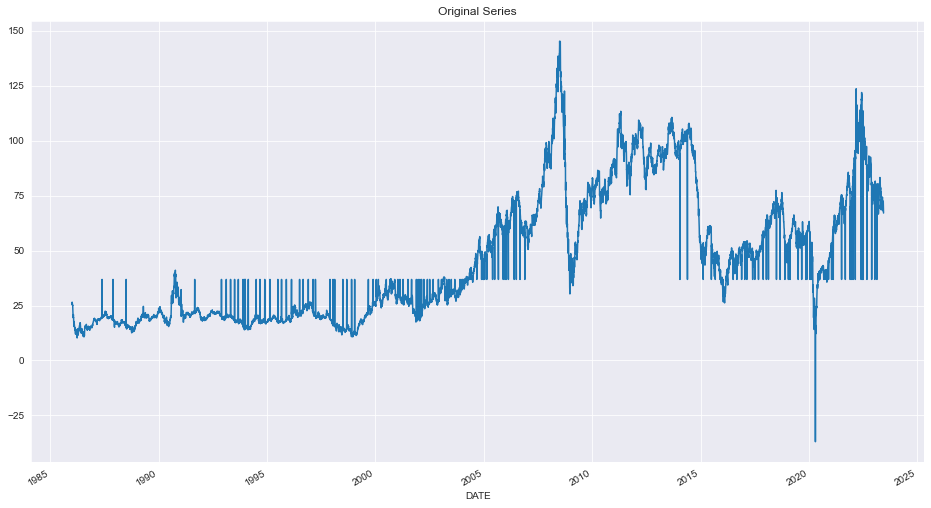

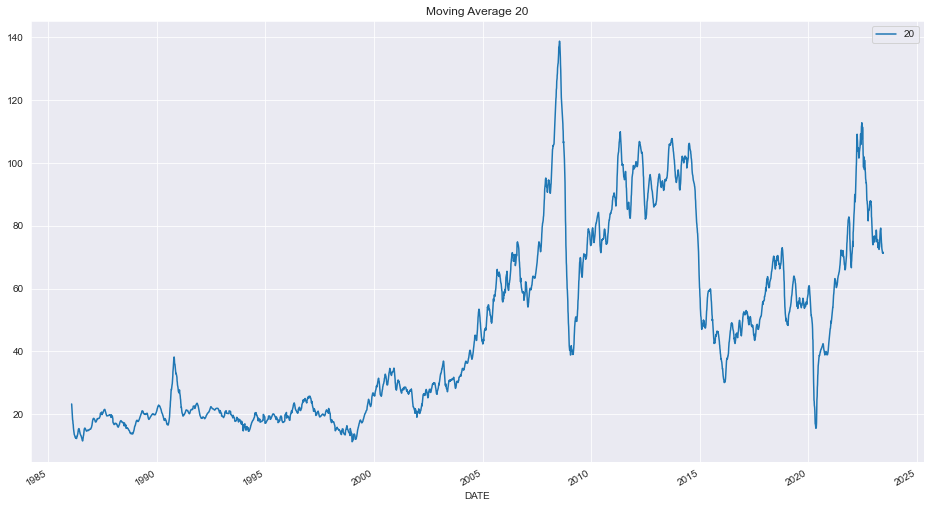

In [33]:
plt.figure(figsize=(16,9))
data.PRICE.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(16,9))
data['PRICE'].rolling(20).mean().plot(label=str(20))
plt.title("Moving Average "+str(20))
plt.legend(loc='best')
plt.show()

## Visualisation of prices by RESAMPLING

#### on Weekly basis

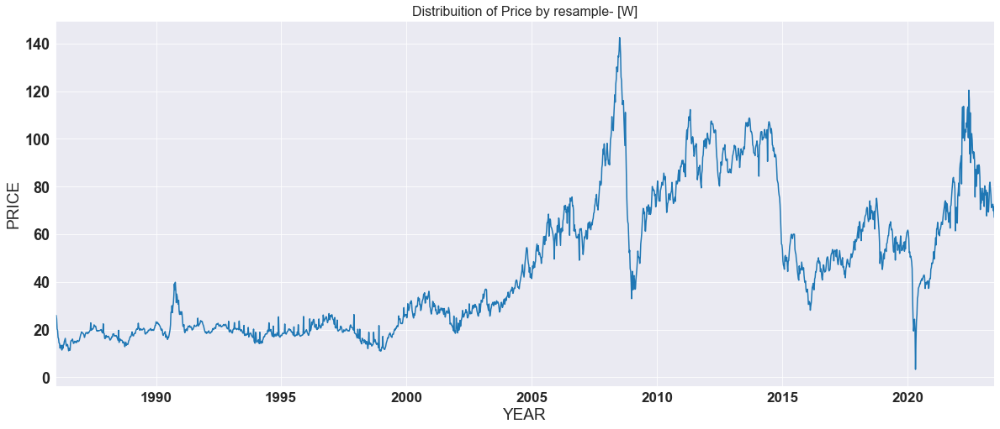

In [34]:
data['PRICE'].resample('W').mean().plot(figsize=(20,8))
plt.title('Distribuition of Price by resample- [W]',fontsize=16)
plt.yticks(fontsize=18,fontweight = 'bold')
plt.xticks(fontsize=17,fontweight = 'bold')
plt.xlabel('YEAR',fontsize=19)
plt.ylabel('PRICE',fontsize=19);

### On Monthly Basis

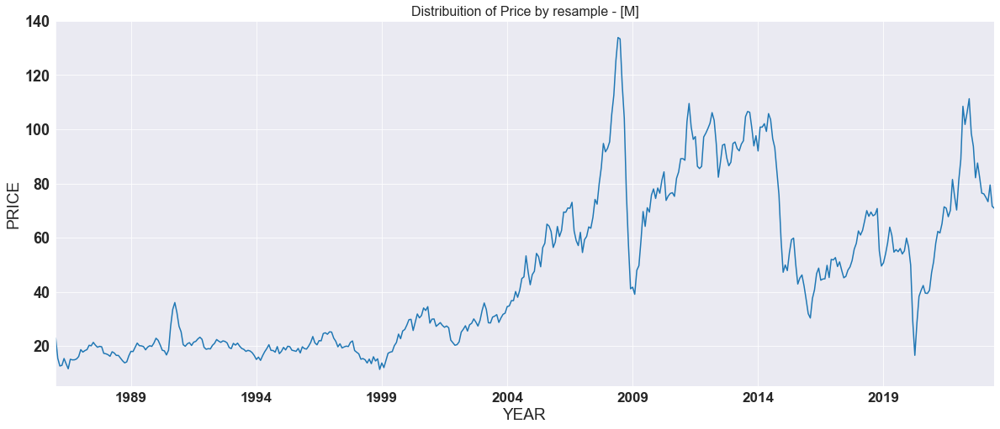

In [35]:
data['PRICE'].resample('M').mean().plot(figsize=(20,8))
plt.title('Distribuition of Price by resample - [M]',fontsize=16)
plt.yticks(fontsize=18,fontweight = 'bold')
plt.xticks(fontsize=17,fontweight = 'bold')
plt.xlabel('YEAR',fontsize=19)
plt.ylabel('PRICE',fontsize=19);

## Quarterly Basis

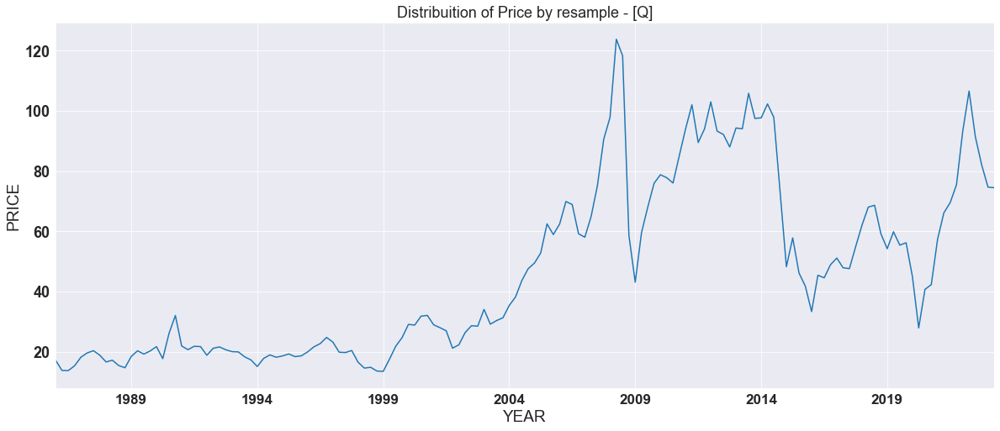

In [36]:
data['PRICE'].resample('Q').mean().plot(figsize=(20,8))
plt.title('Distribuition of Price by resample - [Q]',fontsize=18)
plt.yticks(fontsize=18,fontweight = 'bold')
plt.xticks(fontsize=17,fontweight = 'bold')
plt.xlabel('YEAR',fontsize=19)
plt.ylabel('PRICE',fontsize=19);

In [37]:
df= pd.DataFrame(data['PRICE'].resample('Q').mean())
df.columns =['PRICE']
df.head()

,PRICE
DATE,
1986-03-31,17.217213
1986-06-30,13.866094
1986-09-30,13.813906
1986-12-31,15.406452
1987-03-31,18.250328


## Time series decomposition plot

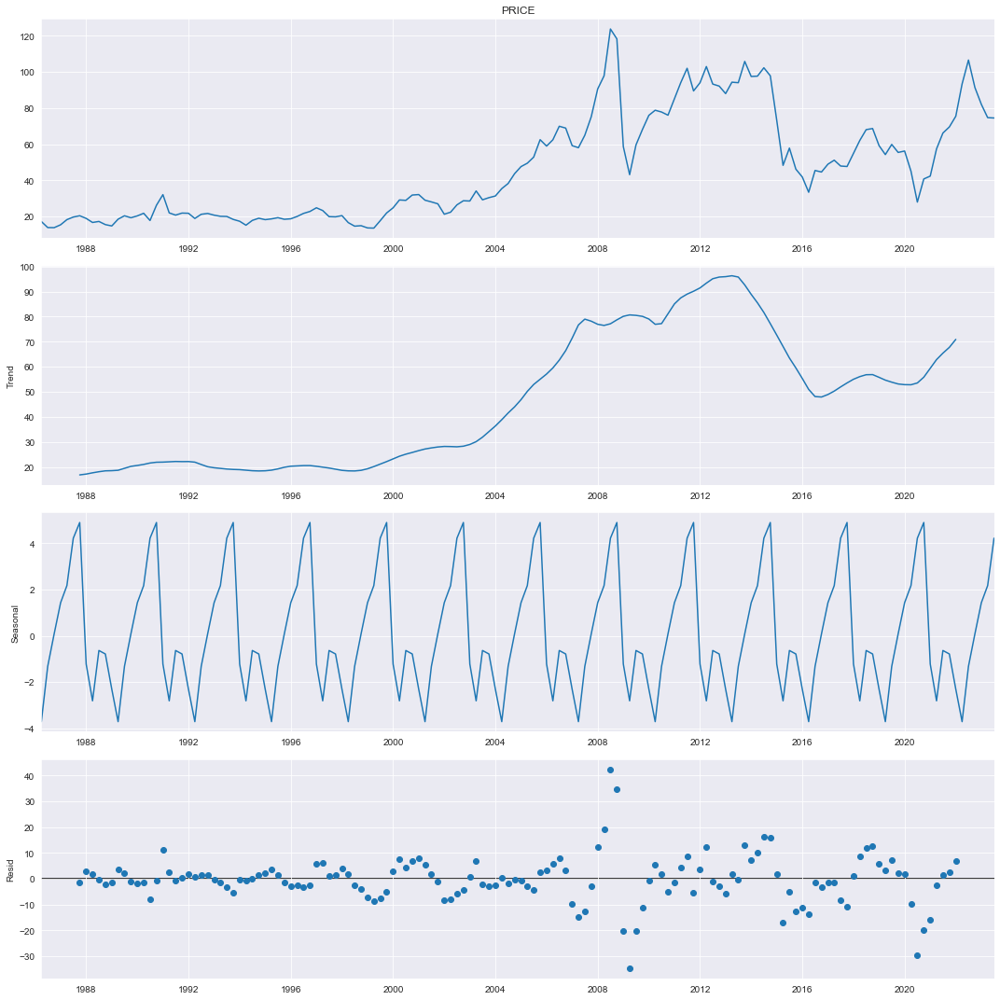

In [38]:
from statsmodels.tsa.seasonal import seasonal_decompose

decompose_ts_add = seasonal_decompose(df.PRICE,period=12)
with plt.rc_context():
    plt.rc("figure", figsize=(15,15))
    decompose_ts_add.plot()
    plt.show()

Observation:-

*Observed* - Actual data

*Trend* - Increasing  trend.

*Seasonal* -
Varies from +4 to -4 with the mean slight above 0 .
Each cycle represents each year trend.
The value in the Y-axis has to be added to the Trend plot value to get the actual value of that year. E.g.:- For the year 1996 , the seasonal value is 1.2 something and the trend value is 20. Hence, teh actual value(passengers number) will (seasonal+Trend) value = 20+1.3 = 21.2.


*Residual* - It is the noise pattern of the time series data for each year, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

## multiplicative seasonality Decomposition

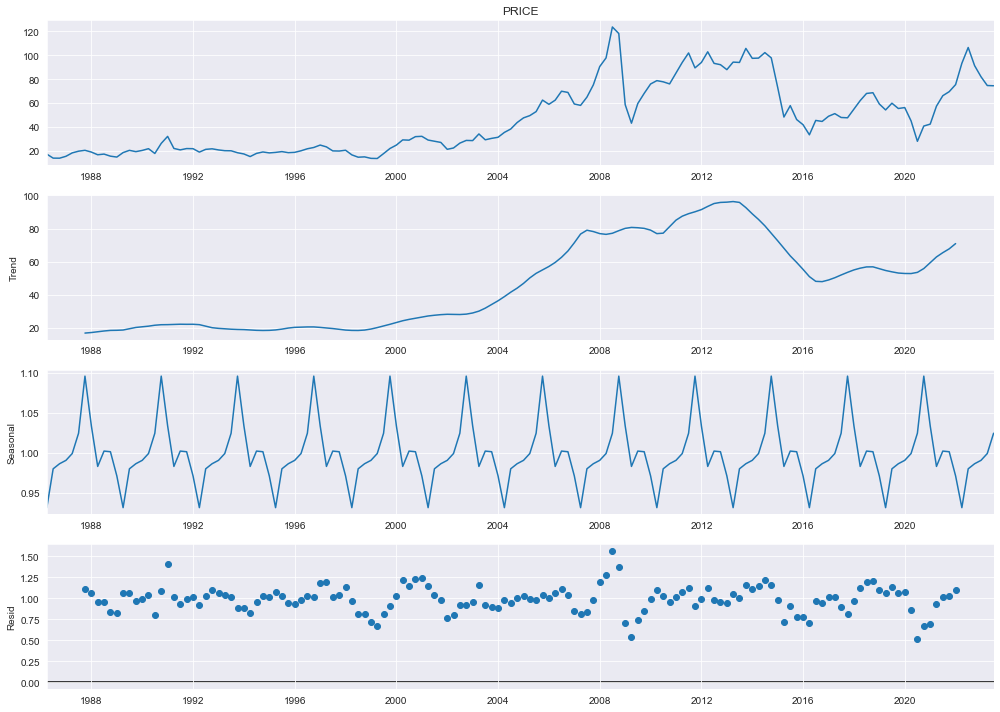

In [39]:
decompose_ts_add = seasonal_decompose(df.PRICE,period=12, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

Observation:-
*Seasonal* -

Varies from 0.8 to 1.2
The value in the Y-axis has to be multiplied to the Trend plot value to get the actual value of that year. E.g.:- For the year 1992 Nov, the seasonal value is 0.87 and the trend value is 22. Hence, the actual value(PRICE ) will (seasonal X Trend) value =0.87 X 22 = 19.14 nearly

### From above seasonality and trend plots we can say that there is randomness in the data.There is a predictable pattern in the price by every 3 to 3.5 years. 

In [40]:
DATA=DATA.reset_index()

In [41]:
DATA

,DATE,PRICE
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9579,2023-06-06,71.71
9580,2023-06-07,72.52
9581,2023-06-08,71.28
9582,2023-06-09,70.16


In [42]:
DATA['Year'] = DATA['DATE'].dt.year
DATA['Month'] = DATA['DATE'].dt.month
DATA['Week'] = DATA['DATE'].dt.week

C:\Users\ABC\AppData\Local\Temp\ipykernel_5756\161060233.py:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  DATA['Week'] = DATA['DATE'].dt.week


In [43]:
DATA.head()

,DATE,PRICE,Year,Month,Week
0,1986-01-02,25.56,1986,1,1
1,1986-01-03,26.00,1986,1,1
2,1986-01-06,26.53,1986,1,2
3,1986-01-07,25.85,1986,1,2
4,1986-01-08,25.87,1986,1,2


In [44]:
DATA.tail()

,DATE,PRICE,Year,Month,Week
9579,2023-06-06,71.71,2023,6,23
9580,2023-06-07,72.52,2023,6,23
9581,2023-06-08,71.28,2023,6,23
9582,2023-06-09,70.16,2023,6,23
9583,2023-06-12,67.08,2023,6,24


In [45]:
DATA=DATA.set_index(['DATE'])

## INPUT AND TARGET VARIABLE

In [46]:
X= DATA.drop(['PRICE'], axis=1)
Y= DATA['PRICE']

In [47]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20)

In [48]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((7667, 3), (1917, 3), (7667,), (1917,))

In [49]:
from sklearn import metrics

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
     

In [50]:
from sklearn.preprocessing import StandardScaler

scale=StandardScaler()

X_train=scale.fit_transform(X_train)
X_test = scale.fit_transform(X_test)

# MODEL BUILDING 

## 1.  Linear Regression 

In [51]:
lr = LinearRegression(normalize=False)
lr.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(


LinearRegression(normalize=False)

In [52]:
y_pred = lr.predict(X_test)
y_pred

array([14.7224569 , 65.47128961, 49.58468999, ..., 81.12574443,
       36.77714869, 25.88661895])

In [53]:
lr_acc = lr.score(X_test,y_test)*100
print("Linear Regressor Accuracy - ",lr_acc)

Linear Regressor Accuracy -  51.50036061308718


In [54]:
y_pred = lr.predict(X_test)
y_pred

array([14.7224569 , 65.47128961, 49.58468999, ..., 81.12574443,
       36.77714869, 25.88661895])

In [55]:


print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


MAE 15.64053020052082
MSE 424.3056042648022
RMSE 20.598679672852874


In [56]:
test_r2_LR=metrics.explained_variance_score(y_test, y_pred)
test_r2_LR

0.5151705652953387

In [57]:
lr_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

lr_df

,Actual,Predicted
DATE,,
1988-08-09,15.560,14.722457
2014-09-02,92.920,65.471290
2006-07-19,72.790,49.584690
2014-02-13,100.270,64.186103
1986-04-22,13.130,10.147604
...,...,...
2010-08-26,73.360,57.575258
1999-05-20,17.040,35.580056
2022-09-27,78.910,81.125744


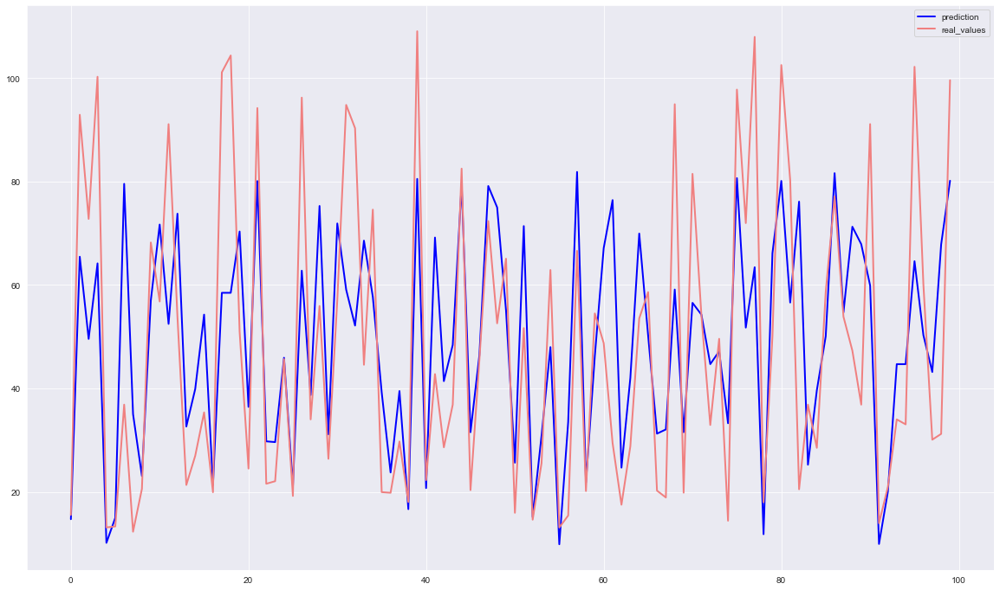

In [58]:

plt.figure(figsize=(20,12))
plt.plot(lr.predict(X_test[:100]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:100].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## 2. Random Forest

In [59]:
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

RandomForestRegressor()

In [60]:
rf_acc = rf.score(X_test,y_test)*100
print("Random Forest Regressor Accuracy - ",rf_acc)

Random Forest Regressor Accuracy -  98.8081039630004


In [61]:
y_pred = rf.predict(X_test)
y_pred

array([15.68652157, 94.74589226, 74.37999429, ..., 80.42835591,
       29.40760361, 17.98551917])

In [62]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


MAE 1.3225089897706797
MSE 10.427462442873372
RMSE 3.2291581631864013


In [63]:
test_r2_RF=metrics.explained_variance_score(y_test, y_pred)
test_r2_RF

0.9880847618254619

In [64]:
rf_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

rf_df

,Actual,Predicted
DATE,,
1988-08-09,15.560,15.686522
2014-09-02,92.920,94.745892
2006-07-19,72.790,74.379994
2014-02-13,100.270,100.195877
1986-04-22,13.130,13.806460
...,...,...
2010-08-26,73.360,72.803065
1999-05-20,17.040,17.081885
2022-09-27,78.910,80.428356


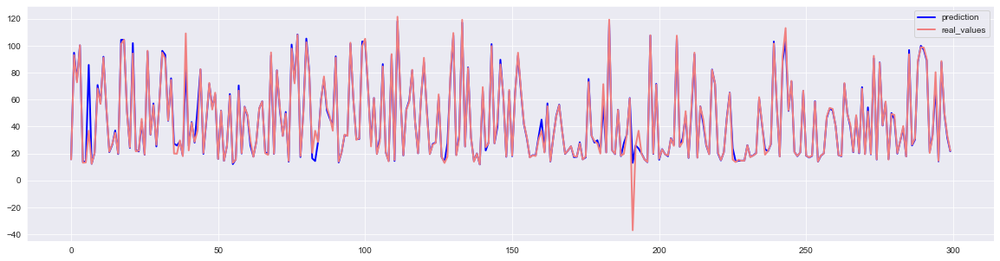

In [65]:
plt.figure(figsize=(20,5))
plt.plot(rf.predict(X_test[:300]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:300].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## 3. K-Nearest Neighbour

In [66]:
knn = KNeighborsRegressor(n_neighbors = 1,weights = 'uniform')
knn.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=1)

In [67]:
knn_acc = knn.score(X_test, y_test)*100
print("KNeigbhbors Regressor Accuracy - ",knn_acc)

KNeigbhbors Regressor Accuracy -  98.2092441943479


In [68]:
y_pred = knn.predict(X_test)
y_pred

array([15.75, 95.5 , 75.7 , ..., 82.61, 29.71, 17.83])

In [69]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


MAE 1.5040845070422535
MSE 15.66666750130412
RMSE 3.958114134446368


In [70]:
test_r2_KNN =metrics.explained_variance_score(y_test, y_pred)
test_r2_KNN

0.9820988970339963

In [71]:
knn_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
knn_df

,Actual,Predicted
DATE,,
1988-08-09,15.560,15.75
2014-09-02,92.920,95.50
2006-07-19,72.790,75.70
2014-02-13,100.270,100.12
1986-04-22,13.130,13.65
...,...,...
2010-08-26,73.360,75.17
1999-05-20,17.040,17.22
2022-09-27,78.910,82.61


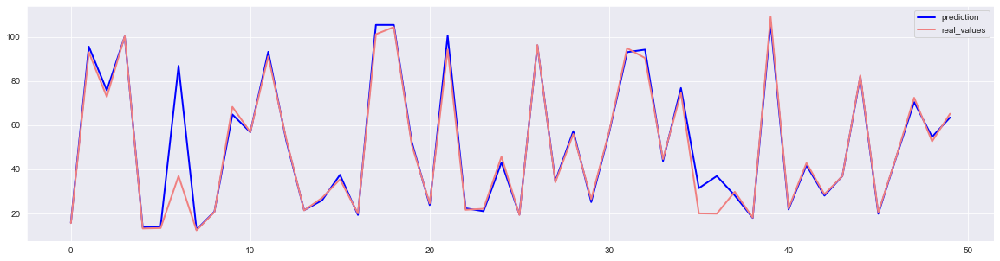

In [72]:
plt.figure(figsize=(20,5))
plt.plot(knn.predict(X_test[:50]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:50].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## 4. XG-Boost

In [73]:
xgbr = XGBRegressor()
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [74]:
xgb_acc = xgbr.score(X_test,y_test)*100
print("XGBoost Regressor Accuracy - ",xgb_acc)

XGBoost Regressor Accuracy -  98.81672868681719


In [75]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE 1.5040845070422535
MSE 15.66666750130412
RMSE 3.958114134446368


In [76]:
test_r2_XGB =metrics.explained_variance_score(y_test, y_pred)
test_r2_XGB

0.9820988970339963

In [77]:
y_pred = xgbr.predict(X_test)

y_pred 

array([15.573866, 95.310196, 73.99575 , ..., 81.58045 , 29.482092,
       18.463179], dtype=float32)

In [78]:

xgb_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
xgb_df

,Actual,Predicted
DATE,,
1988-08-09,15.560,15.573866
2014-09-02,92.920,95.310196
2006-07-19,72.790,73.995750
2014-02-13,100.270,100.505569
1986-04-22,13.130,13.740739
...,...,...
2010-08-26,73.360,74.744987
1999-05-20,17.040,17.700033
2022-09-27,78.910,81.580452


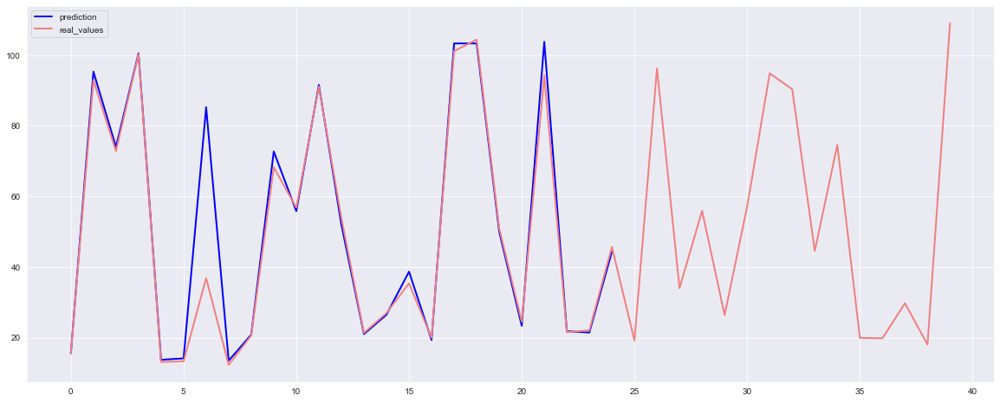

In [79]:

plt.figure(figsize=(20,8))
plt.plot(xgbr.predict(X_test[:25]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:40].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

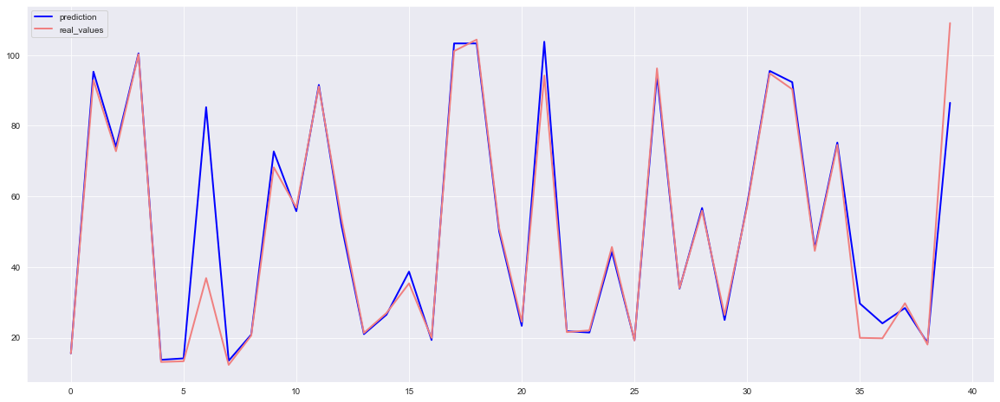

In [80]:

plt.figure(figsize=(20,8))
plt.plot(xgbr.predict(X_test[:40]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:40].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## 5. Deep Neural Network

In [81]:
from keras.layers import Dropout
from keras.optimizers import Adam

In [82]:
def create_model():
  model = Sequential()
  model.add(Dense(64, input_dim=X_train.shape[1], kernel_initializer='normal',activation='softmax'))
  model.add(Dense(32, kernel_initializer='normal'))
  model.add(Dense(1, kernel_initializer='normal'))
  model.compile(loss='mean_absolute_error', optimizer='adam')
  adam = Adam(lr=0.001)
  return model

In [83]:
estimator_model = KerasRegressor(build_fn=create_model, verbose=1)

C:\Users\ABC\AppData\Local\Temp\ipykernel_5756\779415646.py:1: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  estimator_model = KerasRegressor(build_fn=create_model, verbose=1)


In [84]:
history = estimator_model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=50)

C:\Users\ABC\AppData\Roaming\Python\Python39\site-packages\keras\optimizers\optimizer_v2\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
123/123 [==============================] - 4s 6ms/step - loss: 45.3290 - val_loss: 44.2316
Epoch 2/100
123/123 [==============================] - 0s 2ms/step - loss: 40.5754 - val_loss: 36.7454
Epoch 3/100
123/123 [==============================] - 0s 3ms/step - loss: 31.1031 - val_loss: 27.2932
Epoch 4/100
123/123 [==============================] - 0s 2ms/step - loss: 25.3606 - val_loss: 24.1711
Epoch 5/100
123/123 [==============================] - 0s 2ms/step - loss: 22.3498 - val_loss: 20.8938
Epoch 6/100
123/123 [==============================] - 0s 2ms/step - loss: 18.8091 - val_loss: 16.8185
Epoch 7/100
123/123 [==============================] - 0s 2ms/step - loss: 15.1873 - val_loss: 14.0862
Epoch 8/100
123/123 [==============================] - 0s 2ms/step - loss: 13.4056 - val_loss: 12.9642
Epoch 9/100
123/123 [==============================] - 0s 2ms/step - loss: 12.6342 - val_loss: 12.3878
Epoch 10/100
123/123 [==============================] - 0s 2ms/step - los

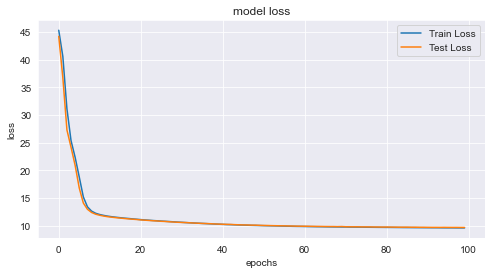

In [85]:

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')

plt.show()

In [86]:
dnn_acc = metrics.r2_score(y_pred, y_test)*100
print("Deep Neural Network accuracy - ",dnn_acc)

Deep Neural Network accuracy -  98.78643064569658


In [87]:
y_pred = estimator_model.predict(X_test)

60/60 [==============================] - 0s 1ms/step


In [88]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


MAE 9.693597704151614
MSE 214.3294660681648
RMSE 14.639995425824587


In [89]:
test_r2_DNN =metrics.explained_variance_score(y_test, y_pred)
test_r2_DNN

0.7558185893376608

In [90]:
dnn_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

dnn_df

,Actual,Predicted
DATE,,
1988-08-09,15.560,19.091345
2014-09-02,92.920,71.693710
2006-07-19,72.790,66.982925
2014-02-13,100.270,76.200012
1986-04-22,13.130,18.772840
...,...,...
2010-08-26,73.360,85.070129
1999-05-20,17.040,20.415905
2022-09-27,78.910,57.195114


5/5 [==============================] - 0s 3ms/step


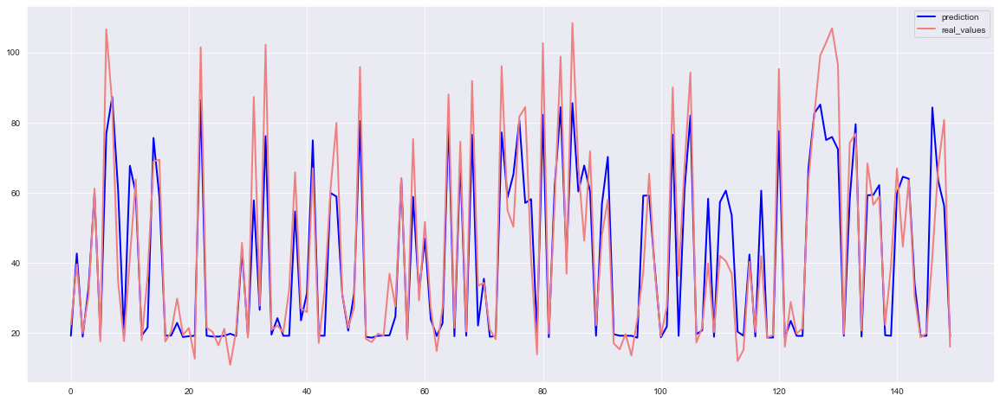

In [91]:

plt.figure(figsize=(20,8))
plt.plot(estimator_model.predict(X_test[300:450]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[300:450].values, label="real_values", linewidth=2.0,color='lightcoral')

plt.legend(loc="best")

## 6.Support vector Regressor

In [92]:
from sklearn.svm import SVR

svr_rbf = SVR(kernel= 'rbf', C= 1e3, gamma= 0.3)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.3)

In [93]:
svr_acc = svr_rbf.score(X_test,y_test)*100
print("SVR Regressor Accuracy - ",svr_acc)

SVR Regressor Accuracy -  79.91874811833581


In [94]:

y_pred = svr_rbf.predict(X_test)

In [95]:

print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


MAE 8.591502774739153
MSE 175.6835271715942
RMSE 13.25456627625341


In [96]:
test_r2_SVR =metrics.explained_variance_score(y_test, y_pred)
test_r2_SVR

0.7995574905519732

In [97]:

SVR_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

SVR_df
     

,Actual,Predicted
DATE,,
1988-08-09,15.560,17.864857
2014-09-02,92.920,73.272492
2006-07-19,72.790,63.706387
2014-02-13,100.270,80.632996
1986-04-22,13.130,15.062698
...,...,...
2010-08-26,73.360,85.780102
1999-05-20,17.040,17.244131
2022-09-27,78.910,81.132367


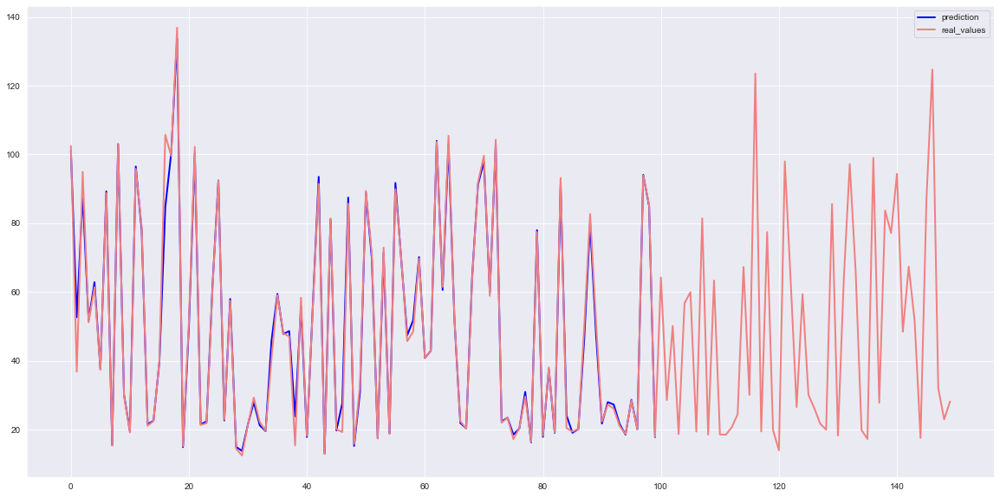

In [98]:

plt.figure(figsize=(20,10))
plt.plot(rf.predict(X_test[600:700]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[600:750].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## 7. LSTM ( Long Short Term Memory )

### LSTM model structure

In [99]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [100]:
DATA.head()

,PRICE,Year,Month,Week
DATE,,,,
1986-01-02,25.56,1986,1,1
1986-01-03,26.00,1986,1,1
1986-01-06,26.53,1986,1,2
1986-01-07,25.85,1986,1,2
1986-01-08,25.87,1986,1,2


In [101]:
# here we need only date and price of the crude oil on that perticular date 
close_df = DATA.iloc[:,[0]]
close_df.head()

,PRICE
DATE,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [102]:
close_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9584 entries, 1986-01-02 to 2023-06-12
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PRICE   9584 non-null   float64
dtypes: float64(1)
memory usage: 149.8 KB


In [103]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of the scaler
scaler = MinMaxScaler()

# Fit the scaler to your data
scaler.fit(close_df)

# Transform your data using the scaler
closedf = scaler.transform(close_df)

In [104]:
closedf

array([[0.34307971],
       [0.34549344],
       [0.3484009 ],
       ...,
       [0.59388886],
       [0.5877448 ],
       [0.57084865]])

In [105]:
closedf.shape

(9584, 1)

### VISUALISING THE SCALED DATA (Representing all data points withing the range of 0-1)

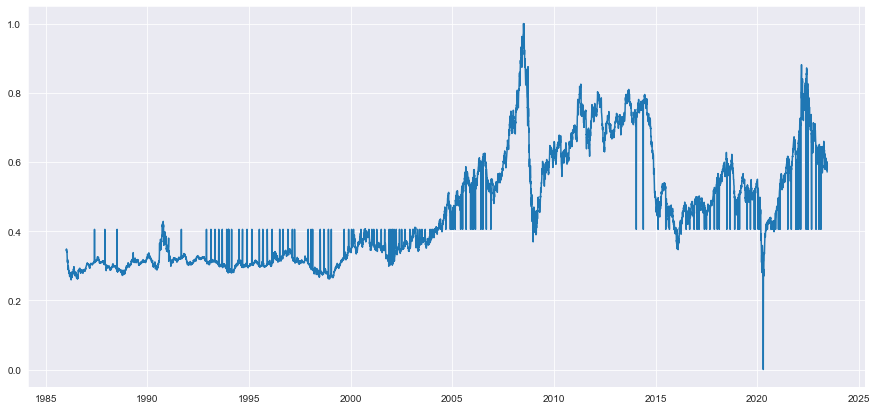

In [106]:
plt.figure(figsize=(15,7))
plt.plot(close_df.index,closedf);

# Train_test_split

In [107]:
# 0.86 - 0.14 train and test split dividing input class and target class 
training_size=int(len(closedf)*0.86)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (8242, 1)
test_data:  (1342, 1)


### Create new dataset according to requirement of time-series prediction

In [108]:
# convert an array of values into a dataset matrix

def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [109]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 150
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (8091, 150)
y_train:  (8091,)
X_test:  (1191, 150)
y_test (1191,)


In [110]:
X_train

array([[0.34307971, 0.34549344, 0.3484009 , ..., 0.26627901, 0.27966427,
        0.28158429],
       [0.34549344, 0.3484009 , 0.34467058, ..., 0.27966427, 0.28158429,
        0.28405288],
       [0.3484009 , 0.34467058, 0.3447803 , ..., 0.28158429, 0.28405288,
        0.28613747],
       ...,
       [0.45959734, 0.4610785 , 0.46941686, ..., 0.53579461, 0.53689177,
        0.53837292],
       [0.4610785 , 0.46941686, 0.46283395, ..., 0.53689177, 0.53837292,
        0.54457184],
       [0.46941686, 0.46283395, 0.46426024, ..., 0.53837292, 0.54457184,
        0.54303582]])

In [111]:
y_train

array([0.28405288, 0.28613747, 0.28421746, ..., 0.54457184, 0.54303582,
       0.55049646])

In [112]:
X_test

array([[0.55532393, 0.56382687, 0.56212628, ..., 0.58483735, 0.57935158,
        0.58225904],
       [0.56382687, 0.56212628, 0.56059027, ..., 0.57935158, 0.58225904,
        0.58275276],
       [0.56212628, 0.56059027, 0.55559822, ..., 0.58225904, 0.58275276,
        0.56761205],
       ...,
       [0.68637885, 0.71073564, 0.70645674, ..., 0.59652203, 0.59860662,
        0.59624774],
       [0.71073564, 0.70645674, 0.68999945, ..., 0.59860662, 0.59624774,
        0.60069121],
       [0.70645674, 0.68999945, 0.6734873 , ..., 0.59624774, 0.60069121,
        0.59388886]])

In [113]:
y_test 

array([0.58275276, 0.56761205, 0.56799605, ..., 0.60069121, 0.59388886,
       0.5877448 ])

#### Making a 3D Data

In [114]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)


X_train:  (8091, 150, 1)
X_test:  (1191, 150, 1)


## Model building

In [115]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(LSTM(32,return_sequences=True,input_shape=(time_step,1)))
model.add(LSTM(32,return_sequences=True))
model.add(LSTM(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [116]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 150, 32)           4352      
                                                                 
 lstm_1 (LSTM)               (None, 150, 32)           8320      
                                                                 
 lstm_2 (LSTM)               (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 21,025
Trainable params: 21,025
Non-trainable params: 0
_________________________________________________________________


In [117]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=10,batch_size=200,verbose=1)

Epoch 1/10
41/41 [==============================] - 82s 1s/step - loss: 0.0431 - val_loss: 0.0031
Epoch 2/10
41/41 [==============================] - 44s 1s/step - loss: 0.0014 - val_loss: 0.0021
Epoch 3/10
41/41 [==============================] - 46s 1s/step - loss: 5.1457e-04 - val_loss: 0.0020
Epoch 4/10
41/41 [==============================] - 47s 1s/step - loss: 5.0215e-04 - val_loss: 0.0020
Epoch 5/10
41/41 [==============================] - 49s 1s/step - loss: 4.9200e-04 - val_loss: 0.0020
Epoch 6/10
41/41 [==============================] - 43s 1s/step - loss: 4.8846e-04 - val_loss: 0.0020
Epoch 7/10
41/41 [==============================] - 45s 1s/step - loss: 4.8431e-04 - val_loss: 0.0020
Epoch 8/10
41/41 [==============================] - 52s 1s/step - loss: 4.8037e-04 - val_loss: 0.0020
Epoch 9/10
41/41 [==============================] - 59s 1s/step - loss: 4.6978e-04 - val_loss: 0.0020
Epoch 10/10
41/41 [==============================] - 56s 1s/step - loss: 4.5764e-04 - val_

In [118]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

38/38 [==============================] - 5s 129ms/step


((8091, 1), (1191, 1))

In [119]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1))

In [120]:
import math
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  3.868599705012266
Train data MSE:  14.966063677620992
Test data MAE:  2.382698647863652
-------------------------------------------------------------------------------------
Test data RMSE:  8.03302385510265
Test data MSE:  64.52947225664825
Test data MAE:  4.579186965500377


In [121]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict)*100)
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict)*100)

Train data explained variance regression score: 98.29947809926003
Test data explained variance regression score: 86.05688286463172


In [122]:
train_r2_LSTM=r2_score(original_ytrain, train_predict)
train_r2_LSTM=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_LSTM)
print("Test data R2 score:", train_r2_LSTM)

Train data R2 score: 0.8599429270771584
Test data R2 score: 0.8599429270771584


In [123]:
DATA.head()

,PRICE,Year,Month,Week
DATE,,,,
1986-01-02,25.56,1986,1,1
1986-01-03,26.00,1986,1,1
1986-01-06,26.53,1986,1,2
1986-01-07,25.85,1986,1,2
1986-01-08,25.87,1986,1,2


In [124]:
DATA=DATA.reset_index()
DATA['DATE']

0      1986-01-02
1      1986-01-03
2      1986-01-06
3      1986-01-07
4      1986-01-08
          ...    
9579   2023-06-06
9580   2023-06-07
9581   2023-06-08
9582   2023-06-09
9583   2023-06-12
Name: DATE, Length: 9584, dtype: datetime64[ns]

In [125]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': DATA['DATE'],
                       'original_close': DATA['PRICE'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (9584, 1)
Test predicted data:  (9584, 1)


In [126]:
original_ytest=  pd.DataFrame(original_ytest, columns =['actual',])

In [127]:
test_predict=pd.DataFrame(test_predict, columns =['predicted',])

In [128]:
original_ytest['predicted']=test_predict
comparison=original_ytest
comparison

,actual,predicted
0,69.25,73.755768
1,66.49,73.584724
2,66.56,73.348404
3,67.25,73.051376
4,67.58,72.708305
...,...,...
1186,72.14,72.556976
1187,71.71,72.449699
1188,72.52,72.358093
1189,71.28,72.290558


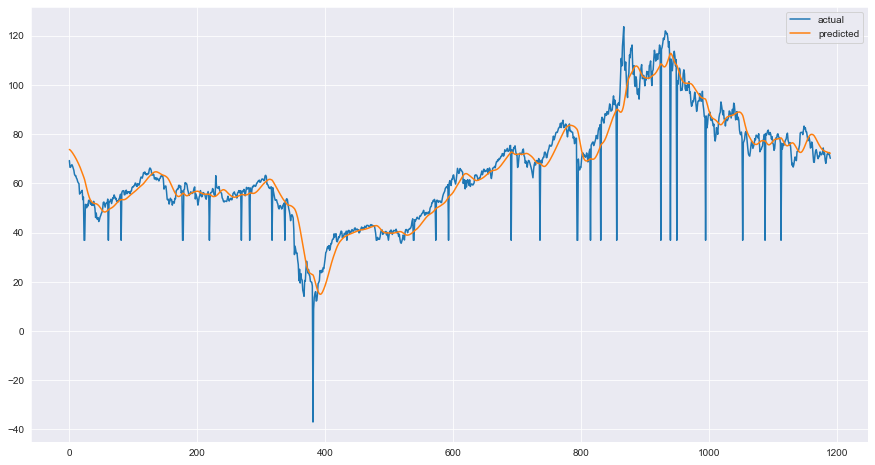

In [129]:

comparison.plot(figsize=(15,8))

plt.show()

## Gated recurrent unit (GRU)

In [130]:
# reshape input to be [samples, time steps, features] which is required for GRU
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (8091, 150, 1)
X_test:  (1191, 150, 1)


In [131]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(GRU(32,return_sequences=True,input_shape=(time_step,1)))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32))

model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [132]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 150, 32)           3360      
                                                                 
 gru_1 (GRU)                 (None, 150, 32)           6336      
                                                                 
 gru_2 (GRU)                 (None, 150, 32)           6336      
                                                                 
 gru_3 (GRU)                 (None, 32)                6336      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 22,401
Trainable params: 22,401
Non-trainable params: 0
_________________________________________________________________


In [133]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=10,batch_size=150,verbose=1)

Epoch 1/10
54/54 [==============================] - 85s 1s/step - loss: 0.0095 - val_loss: 0.0022
Epoch 2/10
54/54 [==============================] - 69s 1s/step - loss: 3.7598e-04 - val_loss: 0.0016
Epoch 3/10
54/54 [==============================] - 63s 1s/step - loss: 2.9999e-04 - val_loss: 0.0016
Epoch 4/10
54/54 [==============================] - 57s 1s/step - loss: 2.9085e-04 - val_loss: 0.0016
Epoch 5/10
54/54 [==============================] - 67s 1s/step - loss: 2.8503e-04 - val_loss: 0.0016
Epoch 6/10
54/54 [==============================] - 68s 1s/step - loss: 2.7776e-04 - val_loss: 0.0016
Epoch 7/10
54/54 [==============================] - 56s 1s/step - loss: 2.7694e-04 - val_loss: 0.0015
Epoch 8/10
54/54 [==============================] - 52s 963ms/step - loss: 2.7113e-04 - val_loss: 0.0015
Epoch 9/10
54/54 [==============================] - 60s 1s/step - loss: 2.6414e-04 - val_loss: 0.0015
Epoch 10/10
54/54 [==============================] - 58s 1s/step - loss: 2.5974e-04

### Loss is decreasing by epoch gradually

In [134]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

38/38 [==============================] - 5s 128ms/step


((8091, 1), (1191, 1))

In [135]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1))

In [136]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  2.9094960600103907
Train data MSE:  8.465167323215987
Test data MAE:  1.4494573729820002
-------------------------------------------------------------------------------------
Test data RMSE:  7.123240154641488
Test data MSE:  50.740550300696896
Test data MAE:  3.2599116874201575


In [137]:
print("Train data explained variance regression score for gru model:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score for gru model:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score for gru model: 0.9902686580413058
Test data explained variance regression score for gru model: 0.890155287478632


In [138]:
train_r2_gru=r2_score(original_ytrain, train_predict)
test_r2_gru=r2_score(original_ytest, test_predict)
print("Train data R2 score for gru model :", train_r2_gru)
print("Test data R2 score for gru model:", test_r2_gru)

Train data R2 score for gru model : 0.9902678308172267
Test data R2 score for gru model: 0.8898708961178952


In [139]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': DATA['DATE'],
                       'original_close': DATA['PRICE'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (9584, 1)
Test predicted data:  (9584, 1)


In [140]:
original_ytest=  pd.DataFrame(original_ytest, columns =['Actual'])

In [141]:
test_predict=pd.DataFrame(test_predict, columns =['Predicted',])

In [142]:
original_ytest['predicted']=test_predict
comparison_gru=original_ytest
comparison_gru

,Actual,predicted
0,69.25,70.729416
1,66.49,70.321053
2,66.56,69.599113
3,67.25,68.831261
4,67.58,68.333389
...,...,...
1186,72.14,70.969772
1187,71.71,71.372421
1188,72.52,71.745041
1189,71.28,72.142471


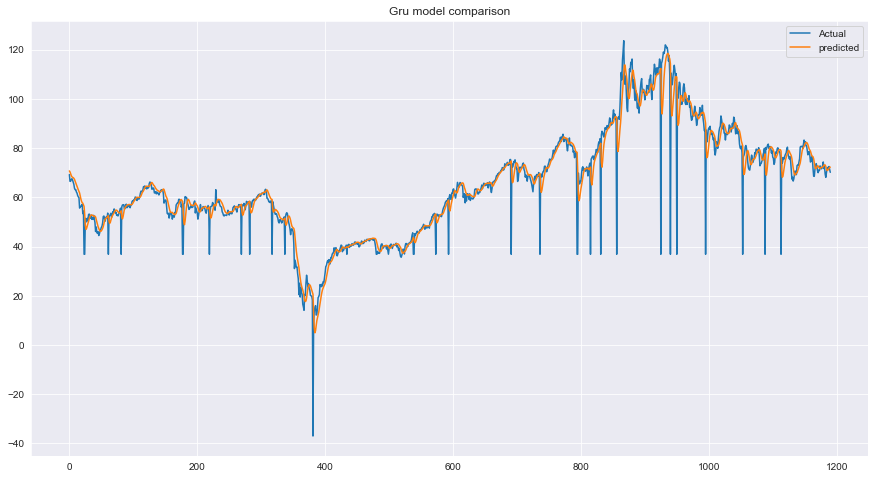

In [143]:
comparison_gru.plot(figsize=(15,8))
plt.title('Gru model comparison')
plt.show()

As you can see actual and forecasted are following very much similar path. that means we cature same trend with slight errors are there.